## Phase 2 State/UT wise analysis

In [1]:
import pandas as pd
import numpy as np

In [2]:
population_India=pd.read_excel('C:/data trained flip robo intern/Data trained final assessment/CrimesInIndia.xlsx')

## 2.5 Analysis of Population vs overall Crime

In [4]:
population_India.head()

,Unnamed: 0,States And UT,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2011.1,2012.1
0,1,Uttar Pradesh,166053600.0,169253600,172453600,175653600,178853600,182053600,185253600,188453600,191653600,194853600,198053600,201253600,199581477,204453600
1,2,Maharashtra,96752500.0,98252500,99752500,101252500,102752500,104252500,105752500,107252500,109052500,110852500,112652500,114452500,112372972,116252500
2,3,Bihar,82879910.0,84782157,86684404,88586651,90488898,92391145,94293392,96195639,98097886,100000133,101902380,103702380,103804630,105502380
3,4,West Bengal,80221300.0,81232794,82244288,83255782,84267276,85278770,86290264,87301758,88313252,89324746,90336240,91347734,91347736,92359228
4,10,Andhra Pradesh,75728400.0,78123091,75728400,73333709,70939018,68544327,66149636,63754945,61360254,58965563,56570872,54176181,49386799,51781490


In [5]:
Crimes_in_india=pd.read_csv('C:/data trained flip robo intern/Data trained final assessment/India_Crime/01_District_wise_crimes_committed_IPC_2001_2012.csv')

In [6]:
Crimes_in_india.head()

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,ADILABAD,2001,101,60,17,50,0,50,46,...,30,1131,16,149,34,175,0,181,1518,4154
1,ANDHRA PRADESH,ANANTAPUR,2001,151,125,1,23,0,23,53,...,69,1543,7,118,24,154,0,270,754,4125
2,ANDHRA PRADESH,CHITTOOR,2001,101,57,2,27,0,27,59,...,38,2088,14,112,83,186,0,404,1262,5818
3,ANDHRA PRADESH,CUDDAPAH,2001,80,53,1,20,0,20,25,...,23,795,17,126,38,57,0,233,1181,3140
4,ANDHRA PRADESH,EAST GODAVARI,2001,82,67,1,23,0,23,49,...,41,1244,12,109,58,247,0,431,2313,6507


In [7]:
df = Crimes_in_india

In [8]:
tcy = pd.DataFrame( df['STATE/UT'][df['DISTRICT']=='TOTAL'])

In [9]:
tcy.head()

,STATE/UT
28,ANDHRA PRADESH
42,ARUNACHAL PRADESH
70,ASSAM
115,BIHAR
135,CHHATTISGARH


In [10]:
tcy['TotalCrime'] = df['TOTAL IPC CRIMES'][df['DISTRICT']=='TOTAL']
tcy['crimeYear'] = df['YEAR'][df['DISTRICT']=='TOTAL']

In [11]:
tcy.head()

,STATE/UT,TotalCrime,crimeYear
28,ANDHRA PRADESH,130089,2001
42,ARUNACHAL PRADESH,2342,2001
70,ASSAM,36877,2001
115,BIHAR,88432,2001
135,CHHATTISGARH,38460,2001


In [12]:
import pandas as pd
import numpy as np
import seaborn as sns
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from random import randint
from sklearn.ensemble import RandomForestRegressor

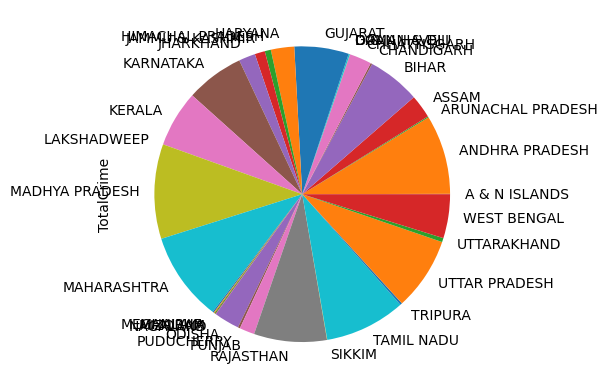

In [13]:
tcy.groupby('STATE/UT').sum()['TotalCrime'].plot.pie()
plt.show()

In [14]:
def get_crime_plot(x):
  x=x
  y='TotalCrime'
  plt.figure(figsize=(50,20))
  sns.barplot(x=x,y=y,data=tcy)
  ax = sns.barplot(x=x,y=y,data=tcy)
  for i in ax.containers:
        ax.bar_label(i,)
  plt.title(x+' vs {}'.format(y),fontsize=100)
  plt.xlabel(x,fontsize=100)
  plt.ylabel(y,fontsize=100)

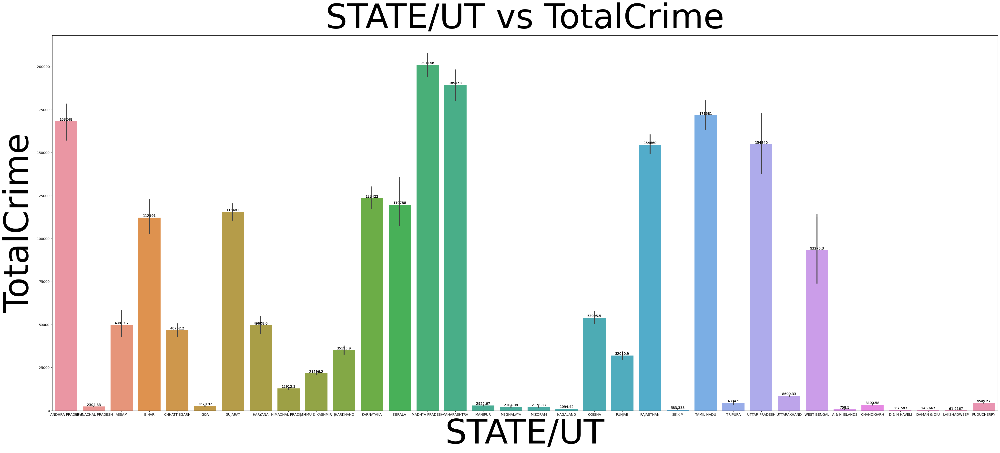

In [15]:
get_crime_plot('STATE/UT')

In [16]:
population_India = population_India.rename(columns={2001:'Year2001',
                       2002:'Year2002',2003:'Year2003',
                       2004:'Year2004',2005:'Year2005',
                       2006:'Year2006',2007:'Year2007',
                       2008:'Year2008',2009:'Year2009',
                       2010:'Year2010','2011.1':'Year2011',
                                                    '2012.1':'Year2012'})

In [17]:
population_India=population_India.drop(columns={2011,2012})

In [20]:
population_India.head()

,Unnamed: 0,States And UT,Year2001,Year2002,Year2003,Year2004,Year2005,Year2006,Year2007,Year2008,Year2009,Year2010,Year2011,Year2012
0,1,Uttar Pradesh,166053600.0,169253600,172453600,175653600,178853600,182053600,185253600,188453600,191653600,194853600,199581477,204453600
1,2,Maharashtra,96752500.0,98252500,99752500,101252500,102752500,104252500,105752500,107252500,109052500,110852500,112372972,116252500
2,3,Bihar,82879910.0,84782157,86684404,88586651,90488898,92391145,94293392,96195639,98097886,100000133,103804630,105502380
3,4,West Bengal,80221300.0,81232794,82244288,83255782,84267276,85278770,86290264,87301758,88313252,89324746,91347736,92359228
4,10,Andhra Pradesh,75728400.0,78123091,75728400,73333709,70939018,68544327,66149636,63754945,61360254,58965563,49386799,51781490


In [21]:
def get_count_plot(x):
  x=x
  y='States And UT'
  plt.figure(figsize=(50,20))
  sns.barplot(x=x,y=y,data=population_India)
  ax = sns.barplot(x=x,y=y,data=population_India)
  for i in ax.containers:
        ax.bar_label(i,)
  plt.title(x+' vs {}'.format(y),fontsize=100)
  plt.xlabel(x,fontsize=100)
  plt.ylabel(y,fontsize=100)

## Year wise State population:

<Axes: ylabel='Year2001'>

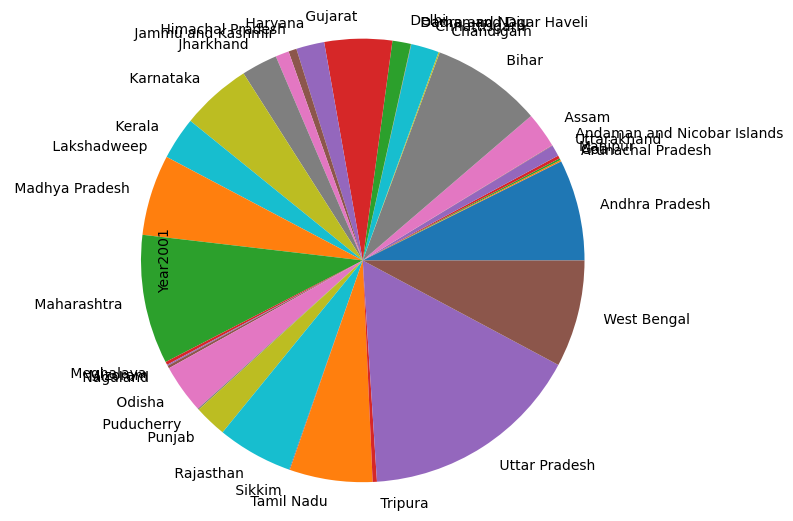

In [22]:
population_India.groupby('States And UT').sum()['Year2001'].plot.pie(radius=1.5)

<Axes: ylabel='TotalCrime'>

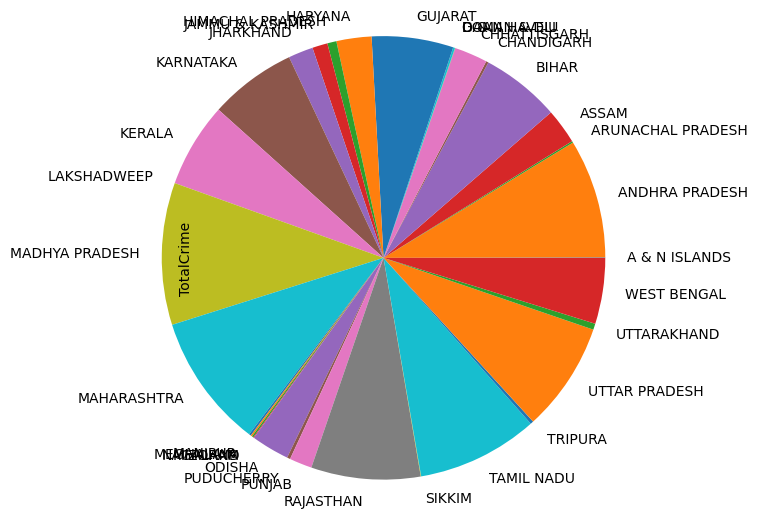

In [23]:
tcy.groupby('STATE/UT').sum()['TotalCrime'].plot.pie(radius=1.5)

## 2.1 Analysis of Literacy rate VS total crime:

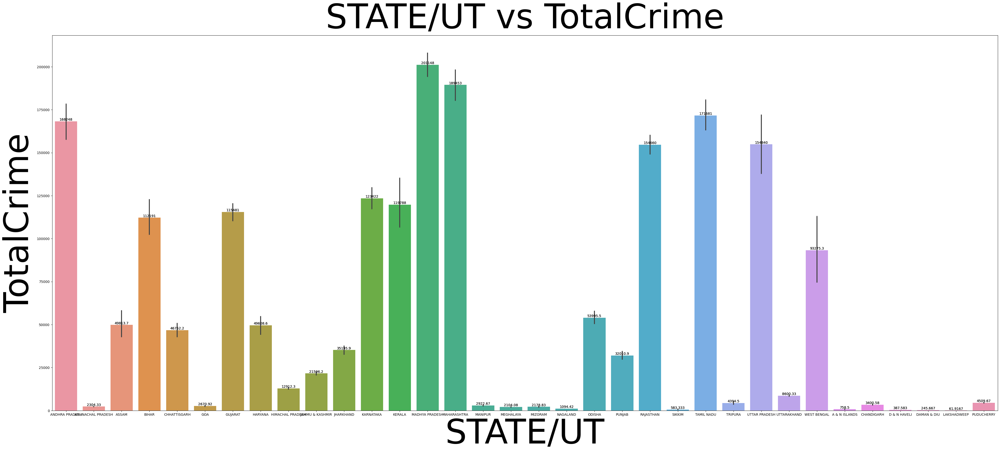

In [24]:
get_crime_plot('STATE/UT')

<Axes: ylabel='TotalCrime'>

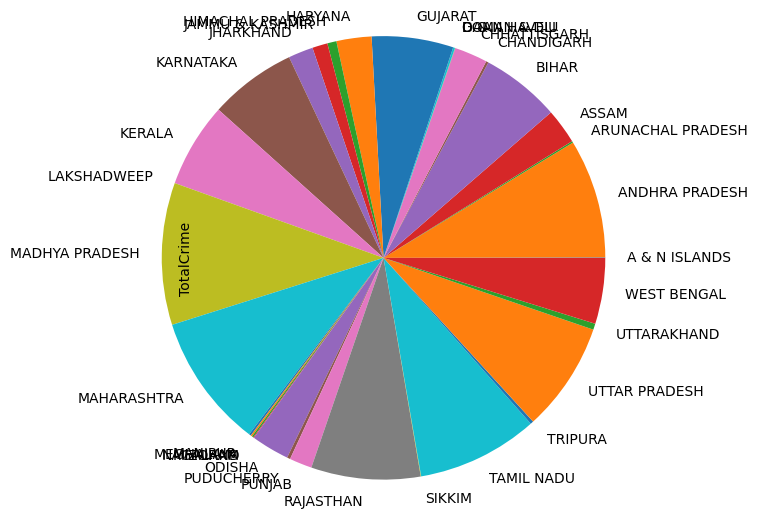

In [25]:
tcy.groupby('STATE/UT').sum()['TotalCrime'].plot.pie(radius=1.5)

In [26]:
literacy_data=pd.read_excel('C:/data trained flip robo intern/Data trained final assessment/Literacy_data.xlsx')

In [27]:
literacy_data = literacy_data.rename(columns={'Census 2001':'Year2001',
                       2002:'Year2002',2003:'Year2003',
                       2004:'Year2004',2005:'Year2005',
                       2006:'Year2006',2007:'Year2007',
                       2008:'Year2008',2009:'Year2009',
                       2010:'Year2010',2011:'Year2011',
                                              2012:'Year2012'})

In [28]:
literacy_data=literacy_data.drop(columns={'Census 2011'})

In [29]:
literacy_data.head()

,Sl. No.,India/States/UTs,Year2001,Year2002,Year2003,Year2004,Year2005,Year2006,Year2007,Year2008,Year2009,Year2010,Year2011,Year2012
0,1,Andhra Pradesh,60.47,61.17,61.87,62.57,63.27,63.97,64.67,65.37,66.07,66.77,67.47,68.17
1,2,Arunachal Pradesh,54.34,55.34,56.34,57.34,58.34,59.34,60.34,61.34,62.34,63.34,64.34,65.34
2,3,Assam,63.25,64.05,64.85,65.65,66.45,67.25,68.05,68.85,69.65,70.45,71.25,72.05
3,4,Bihar,47.00,48.50,50.00,51.50,53.00,54.50,56.00,57.50,59.00,60.50,62.00,63.50
4,5,Chhattisgarh,64.66,65.26,65.86,66.46,67.06,67.66,68.26,68.86,69.46,70.06,70.66,71.26


In [30]:
def get_literacy_plot(x):
  x=x
  y='India/States/UTs'
  plt.figure(figsize=(50,20))
  sns.barplot(x=x,y=y,data=literacy_data)
  ax = sns.barplot(x=x,y=y,data=literacy_data)
  for i in ax.containers:
        ax.bar_label(i,)  
  plt.title(x+'Literacy rate of {}'.format(y),fontsize=100)
  plt.xlabel(x,fontsize=100)
  plt.ylabel(y,fontsize=100)

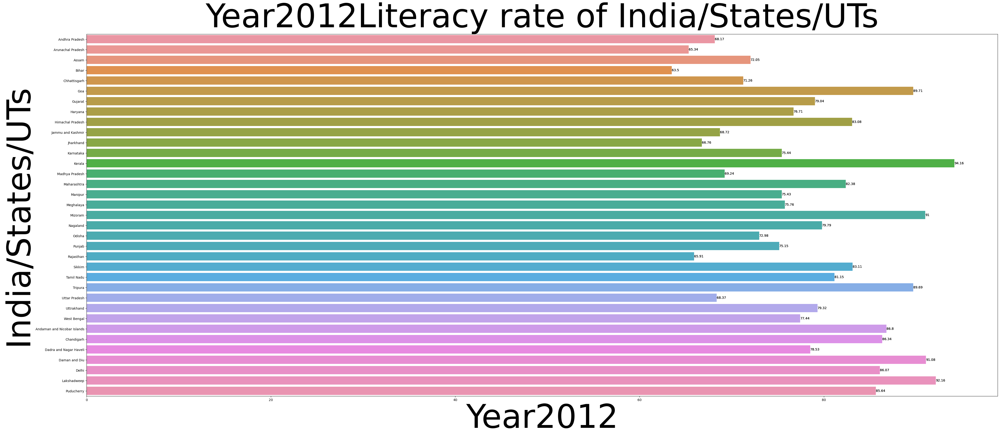

In [31]:
get_literacy_plot('Year2012')

## 2.2 Type of crime VS each state VS and literacy

In [32]:
crimes_state=pd.read_csv('C:/data trained flip robo intern/Data trained final assessment/India_Crime/01_District_wise_crimes_committed_IPC_2001_2012.csv')

In [33]:
literacy_d=pd.read_excel('C:/data trained flip robo intern/Data trained final assessment/Literacy_data.xlsx')

In [34]:
literacy_data=literacy_data.drop(columns='Sl. No.')

Using the previous imported data of Literacy rate:

In [35]:
melted_df=literacy_data

In [36]:
melted_df = pd.melt(melted_df, id_vars=['India/States/UTs'], var_name='Year', value_name='Value')

In [37]:
melted_df

,India/States/UTs,Year,Value
0,Andhra Pradesh,Year2001,60.47
1,Arunachal Pradesh,Year2001,54.34
2,Assam,Year2001,63.25
3,Bihar,Year2001,47.00
4,Chhattisgarh,Year2001,64.66
...,...,...,...
415,Dadra and Nagar Haveli,Year2012,78.53
416,Daman and Diu,Year2012,91.08
417,Delhi,Year2012,86.07
418,Lakshadweep,Year2012,92.16


In [38]:
new_df = crimes_state

In [39]:
state_cr = pd.DataFrame(new_df[(new_df['DISTRICT']=='TOTAL') | (new_df['DISTRICT']=='DELHI UT TOTAL')])

In [40]:
state_cr.index = np.arange(0, len(state_cr))

In [41]:
state_cr

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,ARSON,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES
0,ANDHRA PRADESH,TOTAL,2001,2602,1555,136,871,0,871,1182,...,872,34947,420,3544,2271,5791,7,7400,34344,130089
1,ARUNACHAL PRADESH,TOTAL,2001,83,53,3,33,0,33,83,...,13,466,0,78,3,11,0,0,618,2342
2,ASSAM,TOTAL,2001,1356,481,40,817,0,817,1480,...,441,5805,59,850,4,1248,0,2010,9315,36877
3,BIHAR,TOTAL,2001,3643,3419,250,888,0,888,2159,...,502,7544,859,562,21,1558,83,2406,36667,88432
4,CHHATTISGARH,TOTAL,2001,880,529,45,959,0,959,207,...,215,5477,70,1763,161,840,0,689,15790,38460
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,D & N HAVELI,TOTAL,2012,7,2,0,3,0,3,13,...,12,25,0,2,0,0,0,23,112,318
416,DAMAN & DIU,TOTAL,2012,3,5,0,5,0,5,3,...,11,17,0,0,0,3,0,38,46,239
417,DELHI UT,DELHI UT TOTAL,2012,521,439,82,706,0,706,3970,...,79,1747,134,727,208,1985,0,913,15408,54287
418,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,3,0,1,0,1,0,0,32,60


In [42]:
state_cr['Literacy'] = pd.DataFrame(melted_df['Value'])

In [43]:
state_cr

,STATE/UT,DISTRICT,YEAR,MURDER,ATTEMPT TO MURDER,CULPABLE HOMICIDE NOT AMOUNTING TO MURDER,RAPE,CUSTODIAL RAPE,OTHER RAPE,KIDNAPPING & ABDUCTION,...,HURT/GREVIOUS HURT,DOWRY DEATHS,ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY,INSULT TO MODESTY OF WOMEN,CRUELTY BY HUSBAND OR HIS RELATIVES,IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES,CAUSING DEATH BY NEGLIGENCE,OTHER IPC CRIMES,TOTAL IPC CRIMES,Literacy
0,ANDHRA PRADESH,TOTAL,2001,2602,1555,136,871,0,871,1182,...,34947,420,3544,2271,5791,7,7400,34344,130089,60.47
1,ARUNACHAL PRADESH,TOTAL,2001,83,53,3,33,0,33,83,...,466,0,78,3,11,0,0,618,2342,54.34
2,ASSAM,TOTAL,2001,1356,481,40,817,0,817,1480,...,5805,59,850,4,1248,0,2010,9315,36877,63.25
3,BIHAR,TOTAL,2001,3643,3419,250,888,0,888,2159,...,7544,859,562,21,1558,83,2406,36667,88432,47.00
4,CHHATTISGARH,TOTAL,2001,880,529,45,959,0,959,207,...,5477,70,1763,161,840,0,689,15790,38460,64.66
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,D & N HAVELI,TOTAL,2012,7,2,0,3,0,3,13,...,25,0,2,0,0,0,23,112,318,78.53
416,DAMAN & DIU,TOTAL,2012,3,5,0,5,0,5,3,...,17,0,0,0,3,0,38,46,239,91.08
417,DELHI UT,DELHI UT TOTAL,2012,521,439,82,706,0,706,3970,...,1747,134,727,208,1985,0,913,15408,54287,86.07
418,LAKSHADWEEP,TOTAL,2012,0,0,0,0,0,0,0,...,3,0,1,0,1,0,0,32,60,92.16


In [44]:
df1VizDays=pd.DataFrame(state_cr.groupby('STATE/UT').sum()['TOTAL IPC CRIMES'].sort_values(ascending=False))
df1VizDays.style.background_gradient(cmap=sns.light_palette("red", as_cmap=True))

,TOTAL IPC CRIMES
STATE/UT,
MADHYA PRADESH,2413770
MAHARASHTRA,2273436
TAMIL NADU,2060176
ANDHRA PRADESH,2018981
UTTAR PRADESH,1858074
RAJASTHAN,1855916
KARNATAKA,1481063
KERALA,1437459
GUJARAT,1385775


In [45]:
df1VizDays = pd.DataFrame(state_cr.groupby('STATE/UT')['Literacy'].mean().sort_values(ascending=False))
# Apply background gradient
df1VizDays.style.background_gradient(cmap=sns.light_palette("red", as_cmap=True))

,Literacy
STATE/UT,
KERALA,92.510000
MIZORAM,89.900000
LAKSHADWEEP,89.410000
GOA,85.860000
CHANDIGARH,84.140000
A & N ISLANDS,84.050000
DELHI UT,83.870000
DAMAN & DIU,83.630000
PUDUCHERRY,83.440000


In [46]:
# Function for plotting one feature against another
def get_plot(x,hue):
  x=x
  hue=hue
  y='TOTAL IPC CRIMES'
  plt.figure(figsize=(70,20))
  sns.pointplot(x=x,y=y,hue=hue,data=state_cr)
  plt.xlabel(x,fontsize=(15))
  plt.ylabel(y,fontsize=(15))
  plt.title(y+' '+'in different {}'.format(hue),fontsize=(20))

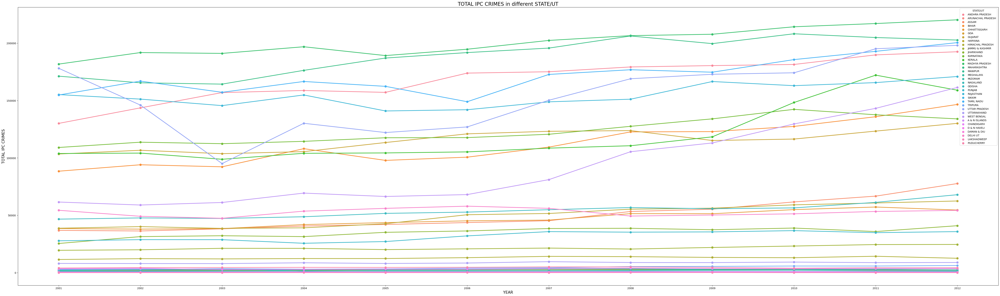

In [47]:
# Hourly rental bike counts during different seasons
get_plot('YEAR','STATE/UT')

In [48]:
# Function for plotting one feature against another
def get_plot(x,hue):
  x=x
  hue=hue
  y='Literacy'
  plt.figure(figsize=(70,20))
  sns.pointplot(x=x,y=y,hue=hue,data=state_cr)
  plt.xlabel(x,fontsize=(15))
  plt.ylabel(y,fontsize=(15))
  plt.title(y+' '+'in different {}'.format(hue),fontsize=(20))

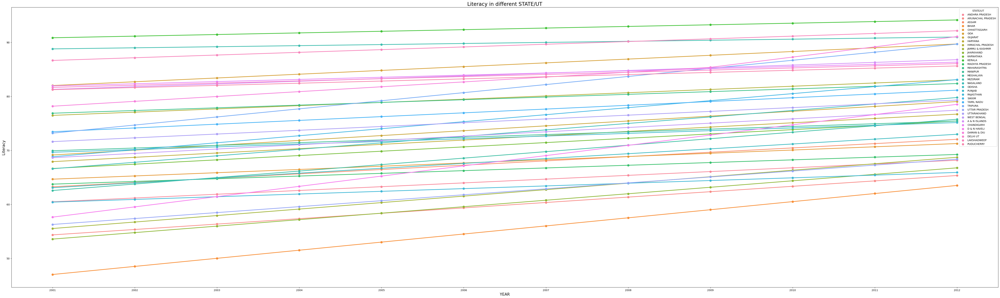

In [49]:
get_plot('YEAR','STATE/UT')

## Types of Crime in Each state

In [50]:
numeric_features = state_cr.describe().columns

In [51]:
numeric_features=numeric_features.drop({'TOTAL IPC CRIMES','Literacy','YEAR'})

In [52]:
numeric_features

Index(['MURDER', 'ATTEMPT TO MURDER',
       'CULPABLE HOMICIDE NOT AMOUNTING TO MURDER', 'RAPE', 'CUSTODIAL RAPE',
       'OTHER RAPE', 'KIDNAPPING & ABDUCTION',
       'KIDNAPPING AND ABDUCTION OF WOMEN AND GIRLS',
       'KIDNAPPING AND ABDUCTION OF OTHERS', 'DACOITY',
       'PREPARATION AND ASSEMBLY FOR DACOITY', 'ROBBERY', 'BURGLARY', 'THEFT',
       'AUTO THEFT', 'OTHER THEFT', 'RIOTS', 'CRIMINAL BREACH OF TRUST',
       'CHEATING', 'COUNTERFIETING', 'ARSON', 'HURT/GREVIOUS HURT',
       'DOWRY DEATHS', 'ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY',
       'INSULT TO MODESTY OF WOMEN', 'CRUELTY BY HUSBAND OR HIS RELATIVES',
       'IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES',
       'CAUSING DEATH BY NEGLIGENCE', 'OTHER IPC CRIMES'],
      dtype='object')

In [55]:
# Function for plotting one feature against another
def get_crimetype(x,hue):
     for y in numeric_features:
            x=x
            hue=hue
            plt.figure(figsize=(40,10))
            sns.pointplot(x=x,y=y,hue=hue,data=state_cr)
            plt.xlabel(x,fontsize=(15))
            plt.ylabel(y,fontsize=(15))
            plt.title(y+' '+'in different {}'.format(hue),fontsize=(20))

C:\Users\goswa\AppData\Local\Temp\ipykernel_27612\364223064.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(40,10))


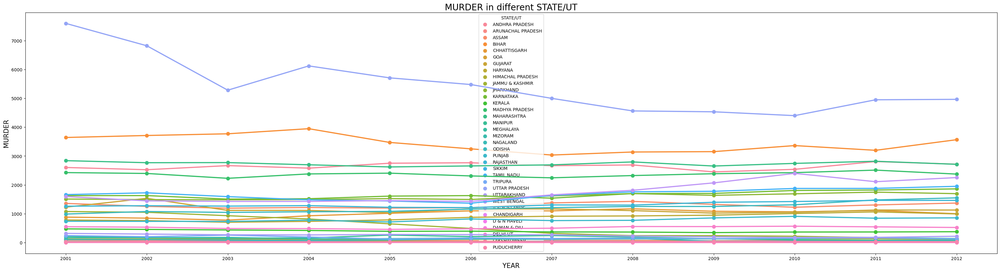

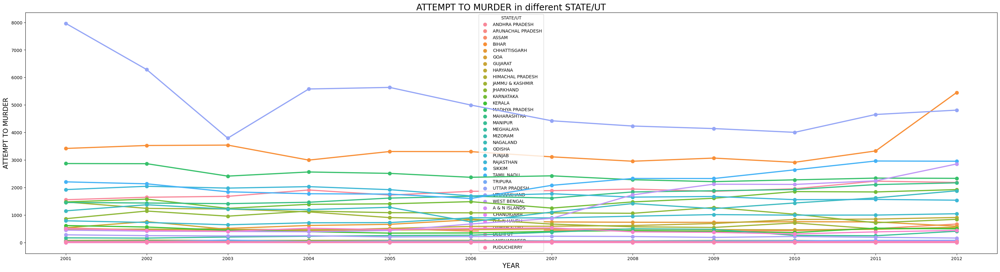

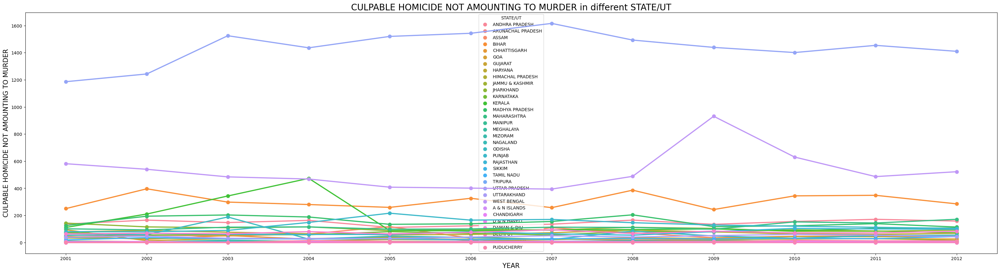

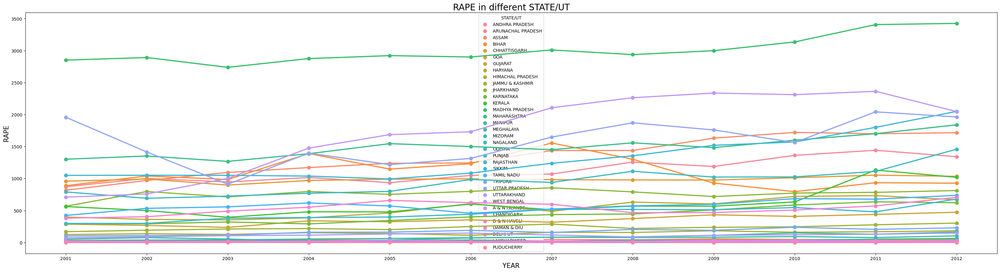

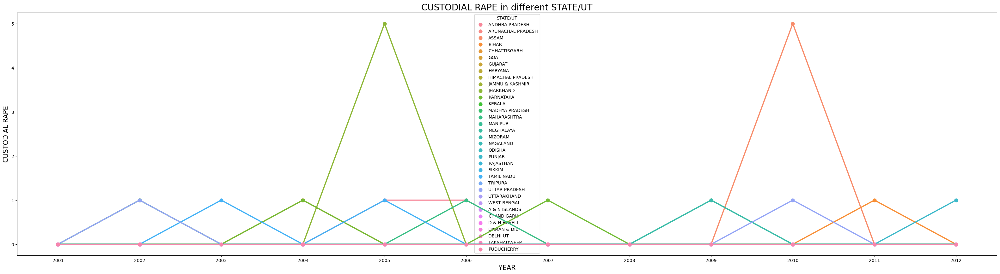

...

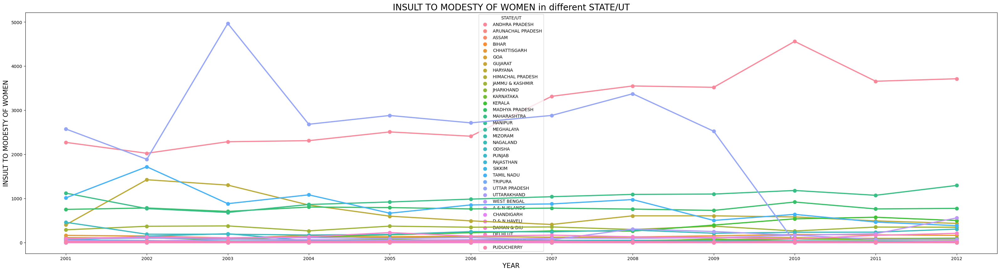

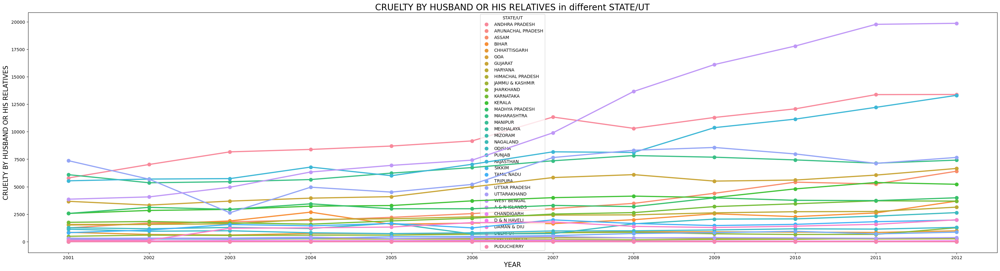

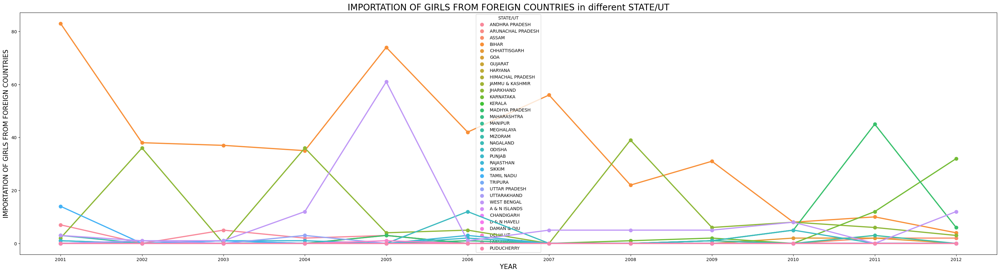

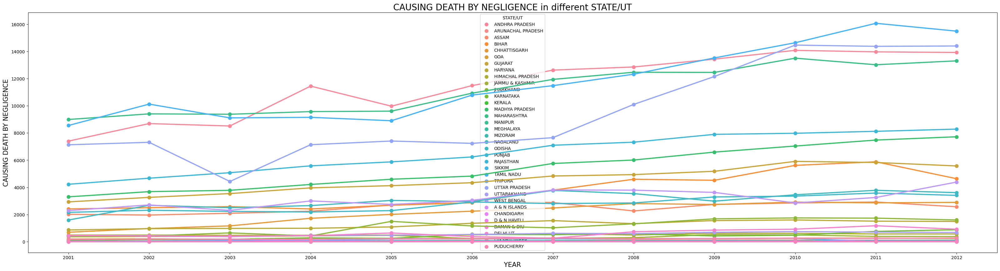

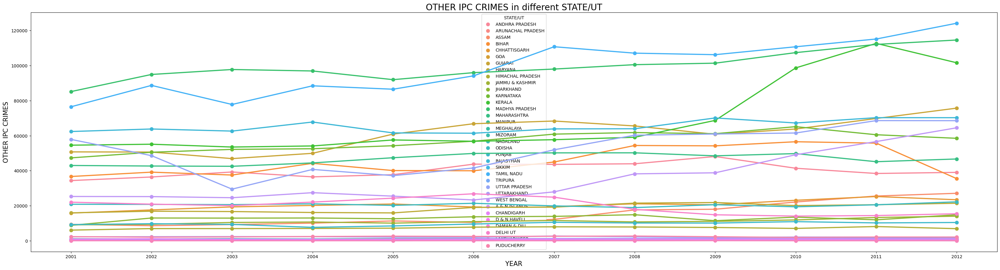

In [56]:
get_crimetype('YEAR','STATE/UT')

## 2.3 Analysis of year-on-year total crime rate :

In [57]:
def get_typecrime_plot(x):
    for y in numeric_features:
        x=x
        plt.figure(figsize=(50,20))
        sns.barplot(x=x,y=y,data=state_cr)
        ax = sns.barplot(x=x,y=y,data=state_cr)
        for i in ax.containers:
                ax.bar_label(i,)  
        plt.title(x+' rate of {}'.format(y),fontsize=100)
        plt.xlabel(x,fontsize=100)
        plt.ylabel(y,fontsize=100)

C:\Users\goswa\AppData\Local\Temp\ipykernel_27612\3243011252.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(50,20))


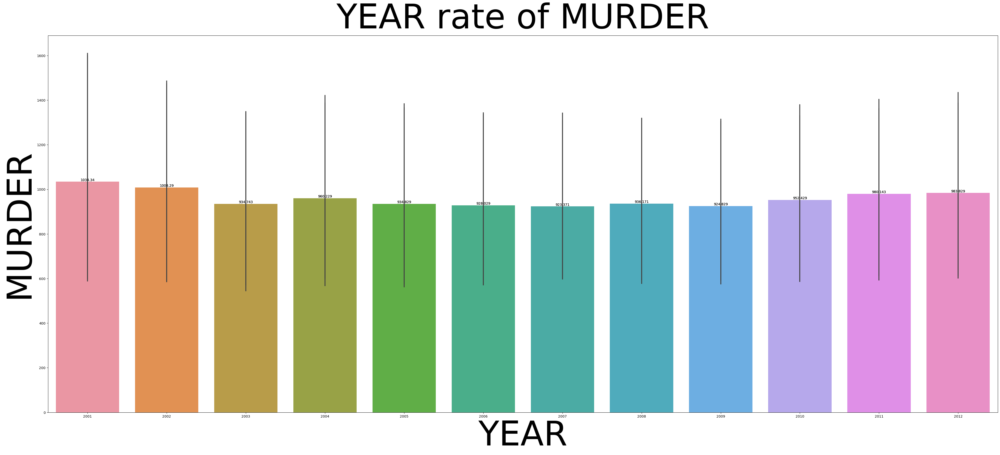

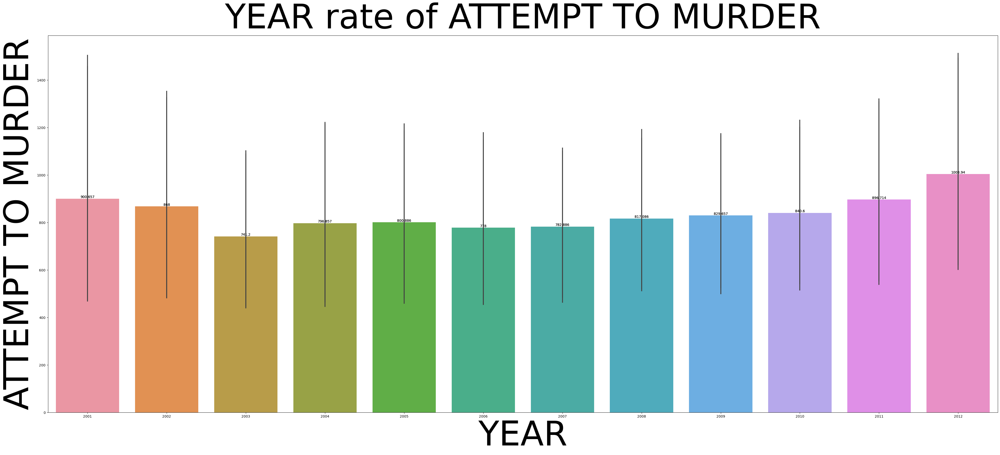

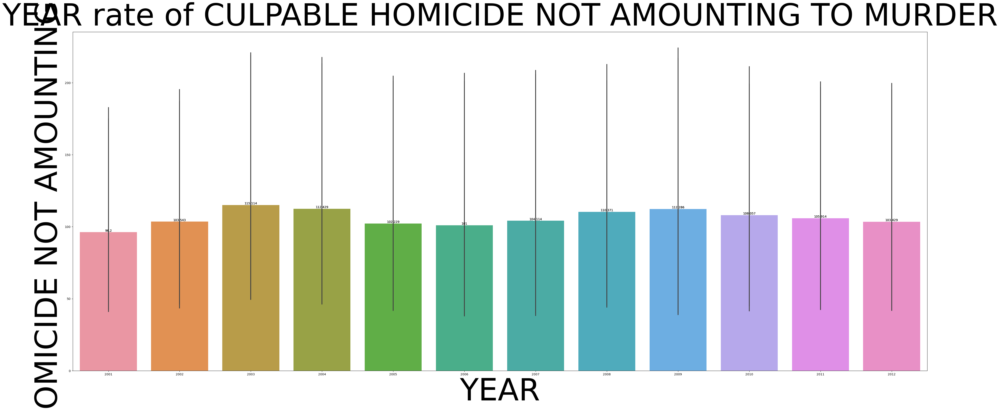

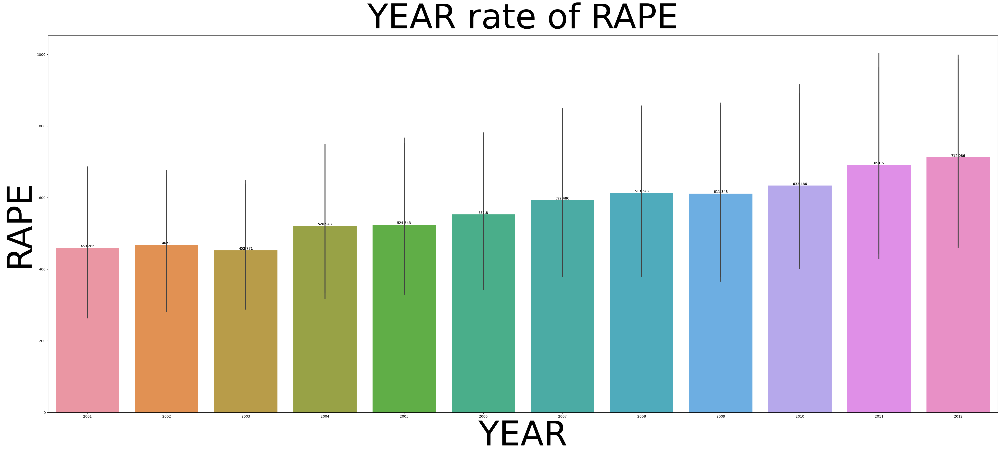

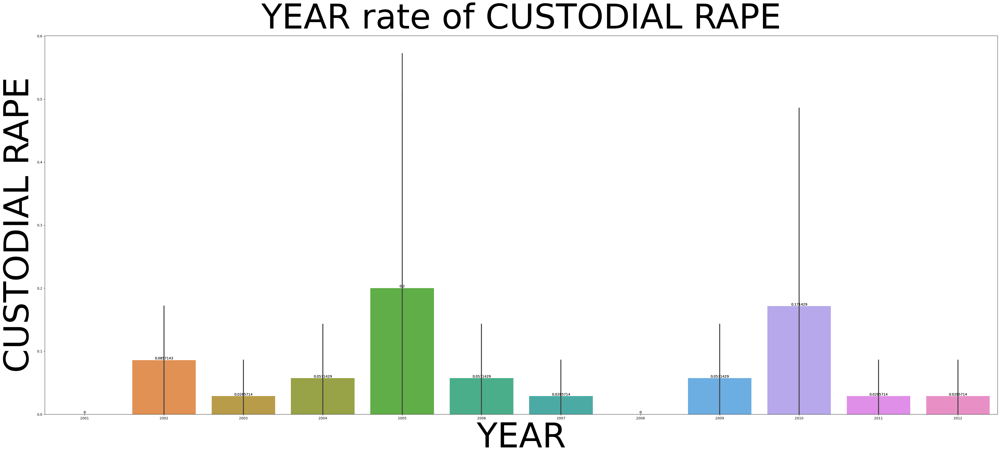

...

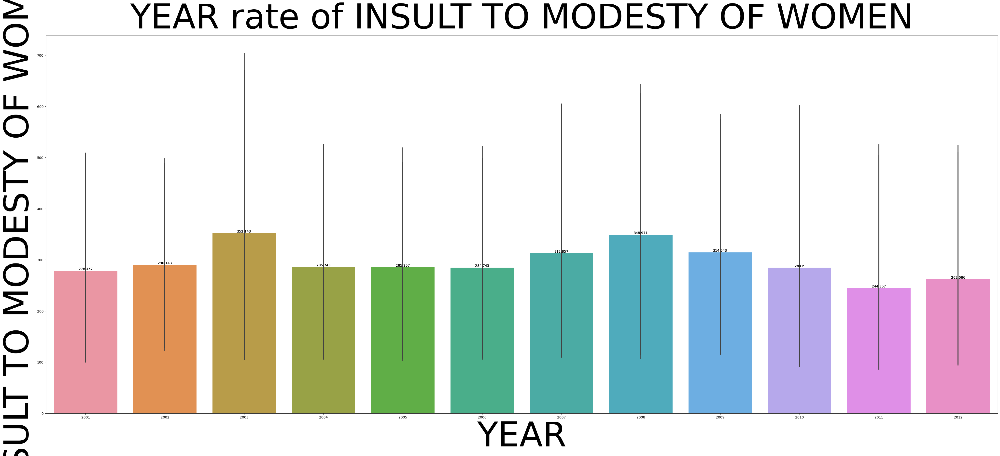

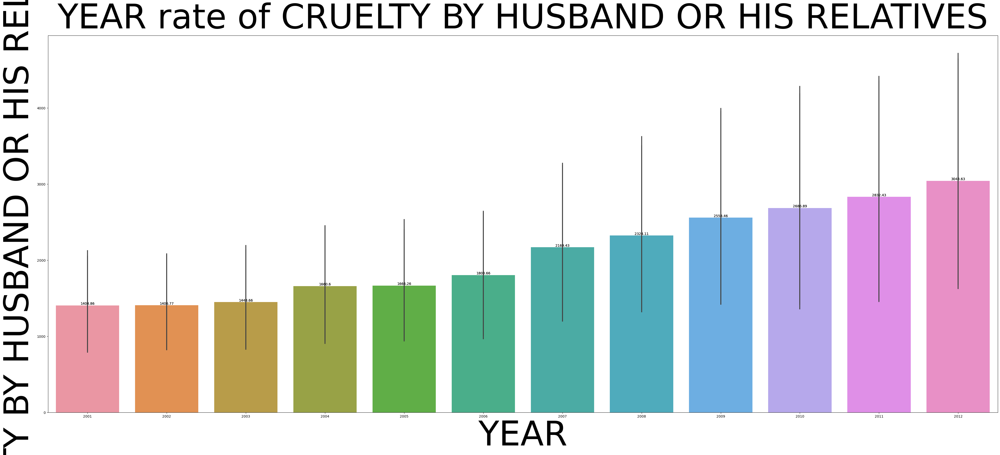

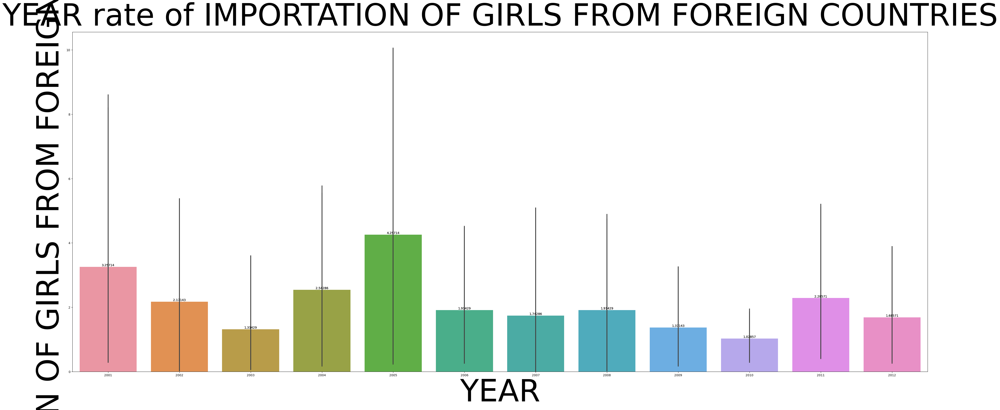

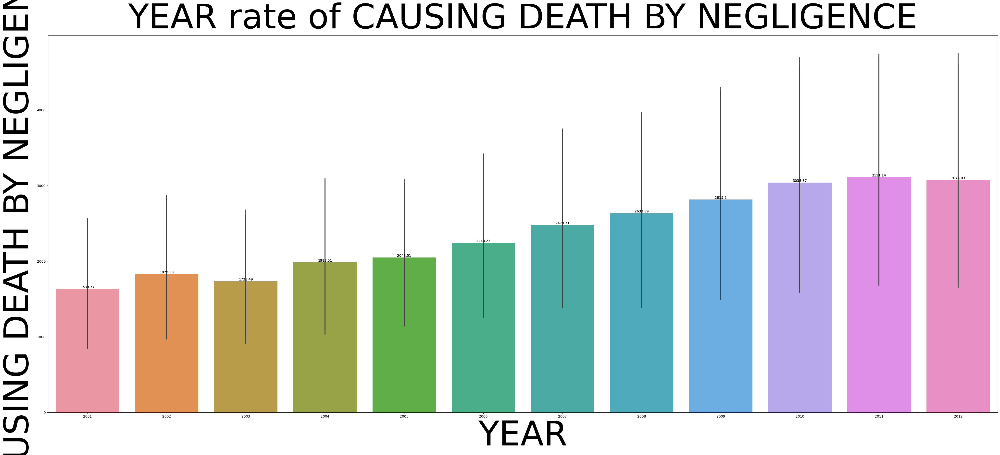

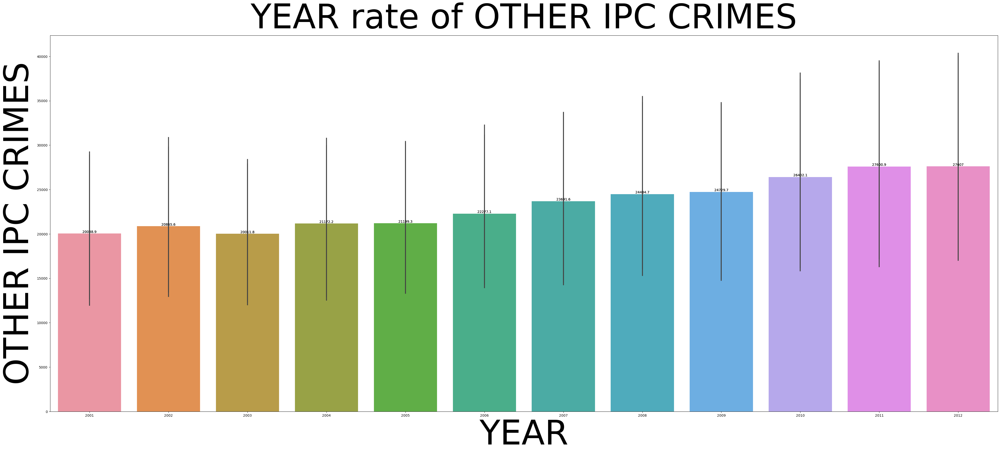

In [58]:
get_typecrime_plot('YEAR')

In [59]:
df1VizDays=pd.DataFrame(state_cr.groupby('YEAR').sum()['TOTAL IPC CRIMES'].sort_values(ascending=False))
df1VizDays.style.background_gradient(cmap=sns.light_palette("red", as_cmap=True))

,TOTAL IPC CRIMES
YEAR,
2012,2387188
2011,2325575
2010,2224831
2009,2121345
2008,2093379
2007,1989673
2006,1878293
2004,1832010
2005,1822602


In [60]:
# Function for plotting each categorical feature against rented_bike_count
def get_totalcrime_year(x):
  x=x
  y='TOTAL IPC CRIMES'
  plt.figure(figsize=(15,5))
  sns.barplot(x=x,y=y,data=state_cr)
  ax =sns.barplot(x=x,y=y,data=state_cr)
  for i in ax.containers:
        ax.bar_label(i,)  
  plt.title(x+' vs {}'.format(y),fontsize=20)
  plt.xlabel(x,fontsize=15)
  plt.ylabel(y,fontsize=15)

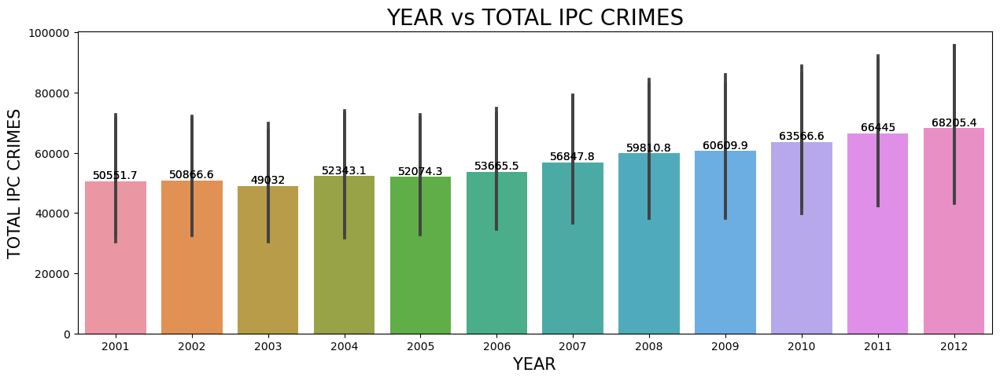

In [61]:
get_totalcrime_year('YEAR')

## 2.4 Analysis of area vs overall crime

In [62]:
Area_states=pd.read_excel('C:/data trained flip robo intern/Data trained final assessment/Area State wise.xlsx')

In [63]:
Area_states=Area_states.drop(columns='Unnamed: 0')

In [64]:
Area_states

,State and UT,Area
0,Rajasthan,342239
1,Madhya Pradesh,308252
2,Maharashtra,307713
3,Uttar Pradesh,240928
4,Gujarat,196244
5,Karnataka,191791
6,Ladakh,166698
7,Andhra Pradesh,162970
8,Odisha,155707
9,Chhattisgarh,135192


In [65]:
df1VizDays=pd.DataFrame(Area_states.groupby('State and UT').sum()['Area'].sort_values(ascending=False))
df1VizDays.style.background_gradient(cmap=sns.light_palette("red", as_cmap=True))

,Area
State and UT,
Rajasthan,342239
Madhya Pradesh,308252
Maharashtra,307713
Uttar Pradesh,240928
Gujarat,196244
Karnataka,191791
Ladakh,166698
Andhra Pradesh,162970
Odisha,155707


In [66]:
# Function for plotting each categorical feature against rented_bike_count
def get_area_plot(x):
  x=x
  y='Area'
  plt.figure(figsize=(50,15))
  sns.barplot(x=x,y=y,data=Area_states)
  ax =sns.barplot(x=x,y=y,data=Area_states)
  for i in ax.containers:
        ax.bar_label(i,)  
  plt.title(x+' vs {}'.format(y),fontsize=20)
  plt.xlabel(x,fontsize=15)
  plt.ylabel(y,fontsize=15)

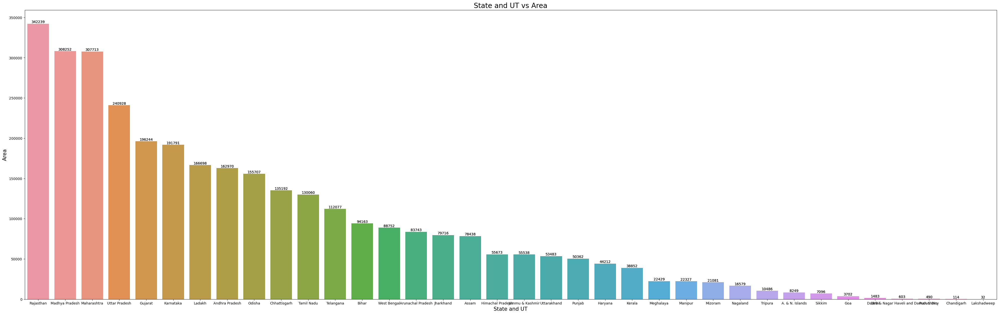

In [67]:
get_area_plot('State and UT')

In [68]:
df1VizDays=pd.DataFrame(state_cr.groupby('STATE/UT').sum()['TOTAL IPC CRIMES'].sort_values(ascending=False))
df1VizDays.style.background_gradient(cmap=sns.light_palette("red", as_cmap=True))

,TOTAL IPC CRIMES
STATE/UT,
MADHYA PRADESH,2413770
MAHARASHTRA,2273436
TAMIL NADU,2060176
ANDHRA PRADESH,2018981
UTTAR PRADESH,1858074
RAJASTHAN,1855916
KARNATAKA,1481063
KERALA,1437459
GUJARAT,1385775


In [69]:
# Function for plotting each categorical feature against rented_bike_count
def get_crimetotal_plot(x):
  x=x
  y='TOTAL IPC CRIMES'
  plt.figure(figsize=(70,25))
  sns.barplot(x=x,y=y,data=state_cr)
  ax =sns.barplot(x=x,y=y,data=state_cr)
  for i in ax.containers:
        ax.bar_label(i,)  
  plt.title(x+' vs {}'.format(y),fontsize=20)
  plt.xlabel(x,fontsize=15)
  plt.ylabel(y,fontsize=15)

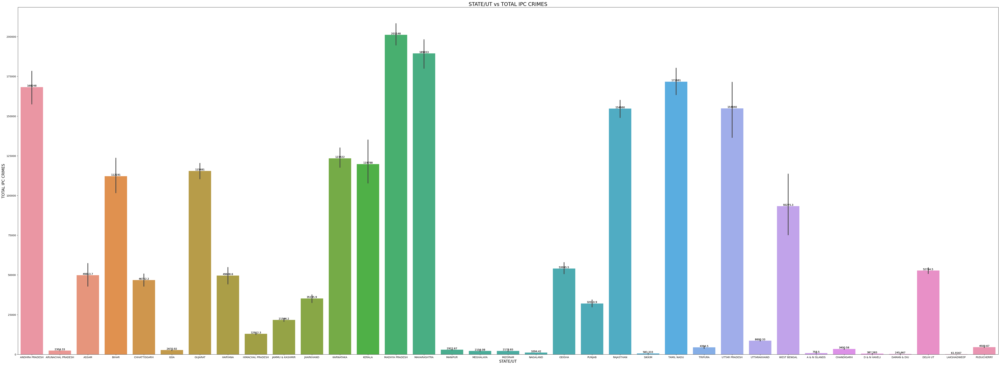

In [70]:
get_crimetotal_plot('STATE/UT')

# 2.6

* UP is the highest populated state and Maharastra, Madhya Pradesh and Andhra Pradesh are afterwards UP in population.
* Maharastra , Madhya Pradesh and tamil Nadu , these state are having the highest crime rates.
* Baed on Literacy rates Kerala is the highest literacy rate almost 93%, and Mizoram and Lakshyadeep are on the list after Kerala.
* Below types of crime are happing on all the states : 

YEAR	MURDER	ATTEMPT TO MURDER	CULPABLE HOMICIDE NOT AMOUNTING TO MURDER	RAPE	CUSTODIAL RAPE	OTHER RAPE	KIDNAPPING & ABDUCTION	...	HURT/GREVIOUS HURT	DOWRY DEATHS	ASSAULT ON WOMEN WITH INTENT TO OUTRAGE HER MODESTY	INSULT TO MODESTY OF WOMEN	CRUELTY BY HUSBAND OR HIS RELATIVES	IMPORTATION OF GIRLS FROM FOREIGN COUNTRIES	CAUSING DEATH BY NEGLIGENCE

* Rajasthan is the biggest state interms of Area wisew, Madhya Pradesh and Maharastra are in 2nd and 3rd.